In [2]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

# Câu 1:
## Viết thành 1 function cho biết thông tin của bức ảnh:
###  Ảnh màu hay ảnh xám và giá trị min max tương ứng với cừng kênh màu

In [3]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

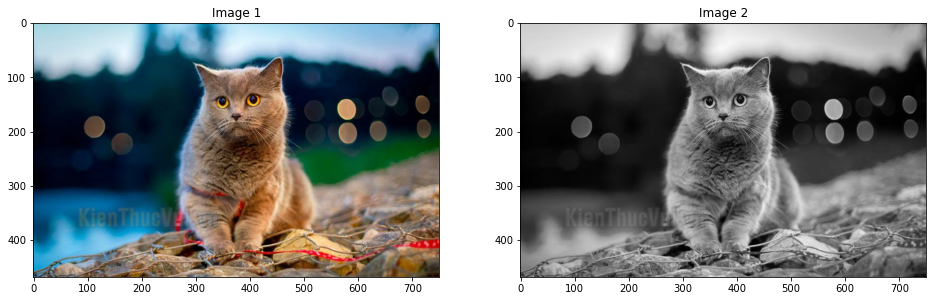

In [4]:
# Read Image 
image_color = imread("kitty.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

In [5]:
# Show Information of Color Image
Image = image_color.copy()
Width = Image.shape[1]
Height = Image.shape[0]
Channel = len(Image.shape)
print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)

IM = image_color.copy
if(Channel == 2):
    print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
else:
    print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
    print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
    print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max())    

Width :  750  Height :  469  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  248
Blue - Min Intensity:  0  Max Intensity:  255


In [6]:
# Show Information of Gray Image
Image = image_gray.copy()
Width = Image.shape[1]
Height = Image.shape[0]
Channel = len(Image.shape)
print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)

IM = image_color.copy
if(Channel == 2):
    print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
else:
    print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
    print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
    print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max())    

Width :  750  Height :  469  Channel :  2
Min Intensity:  0  Max Intensity:  250


In [7]:
def intToBitArray(img) :
    row ,col = img.shape
    list = []
    for i in range(row):
        for j in range(col):
             list.append (np.binary_repr( img[i][j] ,width=8  ) )
    return list #the binary_repr() fucntion returns binary values but in 
                #string 
                #, not integer, which has it's own perk as you will notice 
def bitplane(bitImgVal , img1D ):
    bitList = [  int(   i[bitImgVal]  )    for i in img1D]
    return bitList
def GetBitImage(index, image2D):
    ImageIn1D = intToBitArray(image2D)
    Imagebit = np.array( bitplane(index, ImageIn1D ) )
    Imagebit = np.reshape(Imagebit , image2D.shape )
    return Imagebit
def GetAllBitImage(image2D):
    image2D_Bit = list()
    for i in range(8):
        image2D_Bit.append(GetBitImage(i, image2D))
    return image2D_Bit

## Hiển thị 24 bức ảnh theo bit của từng kênh màu R, G, B (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit)

## Kênh màu RED:

List of channel Red have  8  images


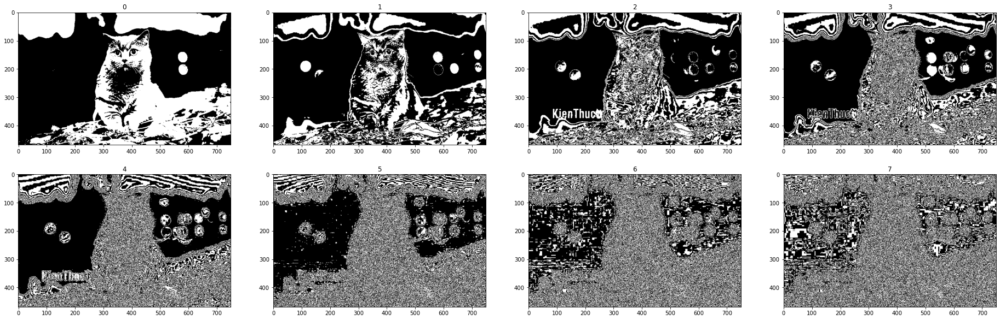

In [8]:
img_channelR = image_color[:,:,0]
img_channelR_Bit = GetAllBitImage(img_channelR)
print("List of channel Red have ", len(img_channelR_Bit), " images")
ShowListImages(img_channelR_Bit, 2, 4)

## Kênh màu GREEN:

List of channel Green have  8  images


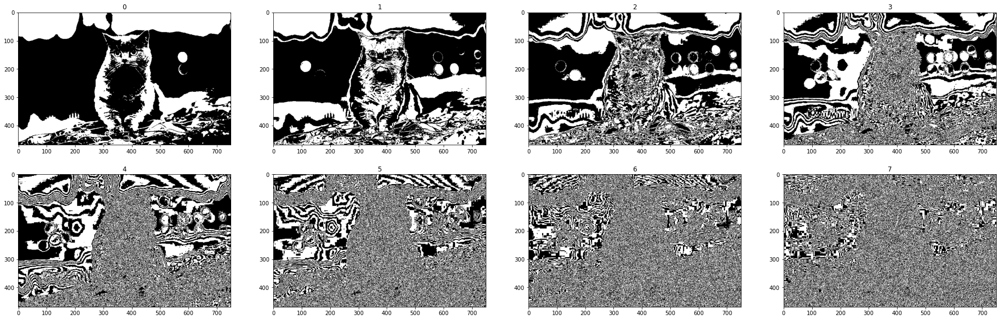

In [9]:
img_channelG = image_color[:,:,1]
img_channelG_Bit = GetAllBitImage(img_channelG)
print("List of channel Green have ", len(img_channelG_Bit), " images")
ShowListImages(img_channelG_Bit, 2, 4)

## Kênh màu BLUE:

List of channel Blue have  8  images


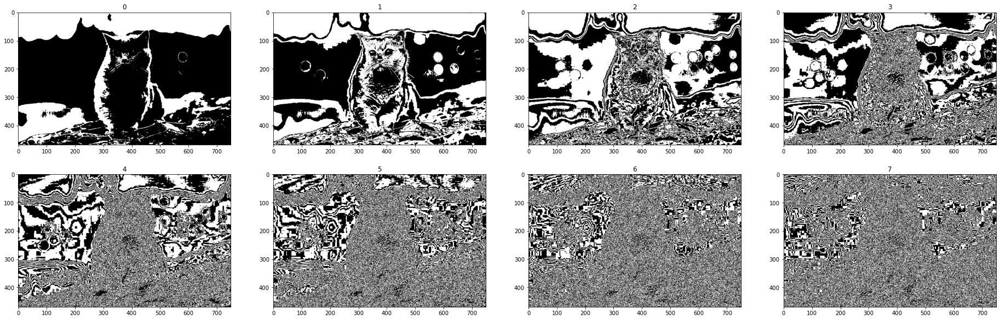

In [10]:
img_channelB = image_color[:,:,2]
img_channelB_Bit = GetAllBitImage(img_channelB)
print("List of channel Blue have ", len(img_channelB_Bit), " images")
ShowListImages(img_channelB_Bit, 2, 4)

## Cho biết trong 24 ảnh bit theo kênh R, G, B có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra


In [11]:
def SegmentColorImageByMask(IM, Mask):    
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

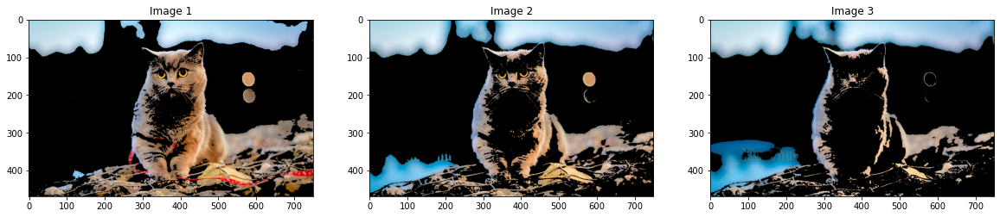

In [12]:
# Take the highest bit image 
KittyMask01 = img_channelR_Bit[0]
KittyMask02 = img_channelG_Bit[0]
KittyMask03 = img_channelB_Bit[0]

KittyMask01_rgb = SegmentColorImageByMask(image_color, KittyMask01)
KittyMask02_rgb = SegmentColorImageByMask(image_color, KittyMask02)
KittyMask03_rgb = SegmentColorImageByMask(image_color, KittyMask03)
ShowThreeImages(KittyMask01_rgb, KittyMask02_rgb, KittyMask03_rgb)

## $\rightarrow$ Có 1 ảnh trích xuất được đối tượng của ảnh. Đó chính "KittyMask01"

## Tạo ảnh HSV và hiển thị các kênh Hue, Saturation và Value

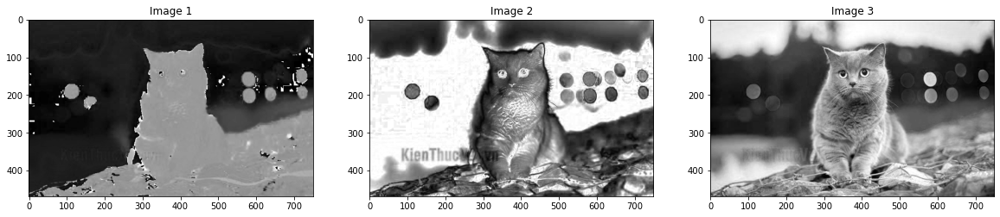

In [13]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)

# Show each channel H , S and V
ShowThreeImages(image_hsv[:,:,0],image_hsv[:,:,1],image_hsv[:,:,2])

## Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit)

## Kênh màu HUE

List of channel Hue have  8  images


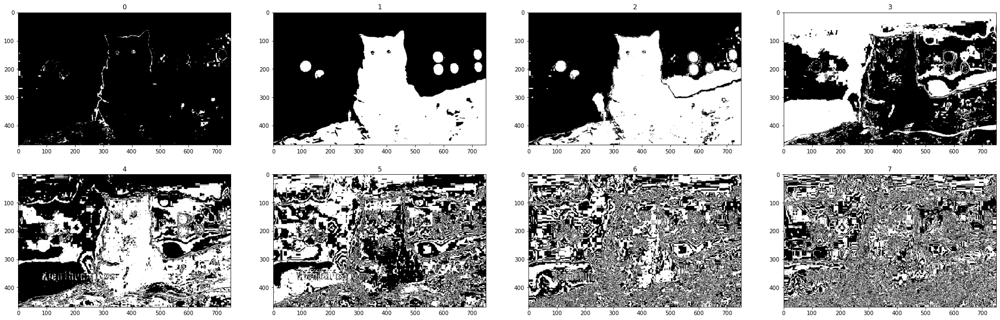

In [15]:
img_channelH = image_hsv[:,:,0]
img_channelH_Bit = GetAllBitImage(img_channelH)
print("List of channel Hue have ", len(img_channelH_Bit), " images")
ShowListImages(img_channelH_Bit, 2, 4)

## Kênh màu SATURATION

List of channel Saturation have  8  images


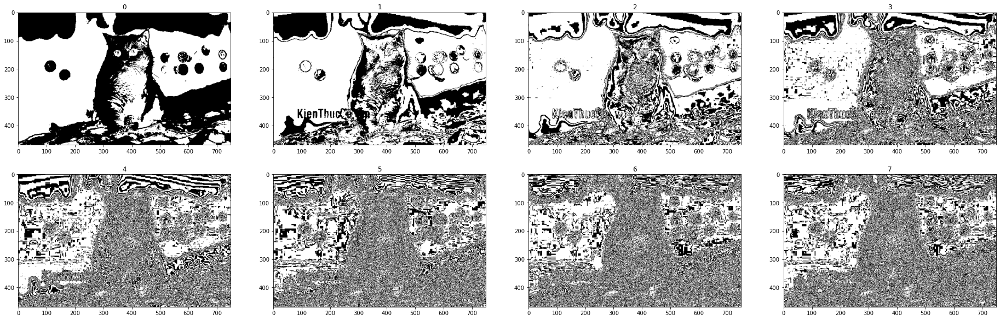

In [16]:
img_channelS = image_hsv[:,:,1]
img_channelS_Bit = GetAllBitImage(img_channelS)
print("List of channel Saturation have ", len(img_channelS_Bit), " images")
ShowListImages(img_channelS_Bit, 2, 4)

## Kênh màu VALUE

List of channel Value have  8  images


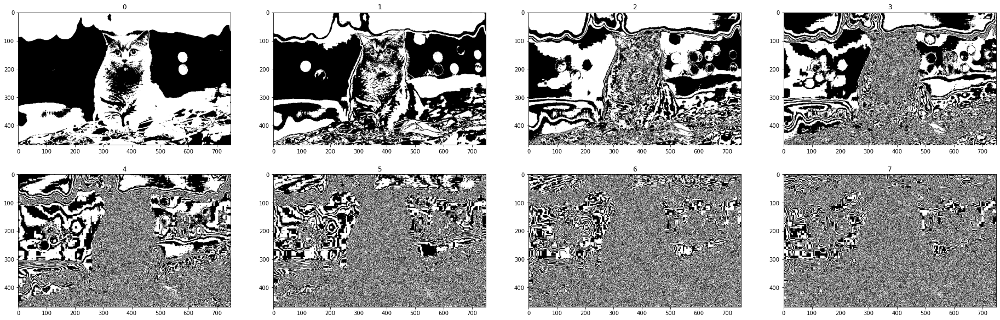

In [18]:
img_channelV = image_hsv[:,:,2]
img_channelV_Bit = GetAllBitImage(img_channelV)
print("List of channel Value have ", len(img_channelV_Bit), " images")
ShowListImages(img_channelV_Bit, 2, 4)

## Cho biết trong 24 ảnh bit theo kênh H, S, V có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

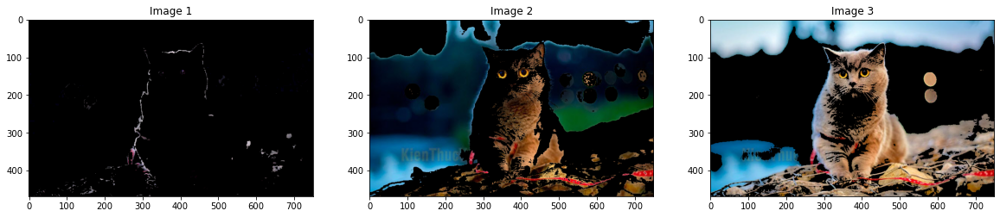

In [19]:
# Take the highest bit image 
KittyMask01 = img_channelH_Bit[0]
KittyMask02 = img_channelS_Bit[0]
KittyMask03 = img_channelV_Bit[0]

KittyMask01_hsv = SegmentColorImageByMask(image_color, KittyMask01)
KittyMask02_hsv = SegmentColorImageByMask(image_color, KittyMask02)
KittyMask03_hsv = SegmentColorImageByMask(image_color, KittyMask03)
ShowThreeImages(KittyMask01_hsv, KittyMask02_hsv, KittyMask03_hsv)

## $\rightarrow$ Có 1 ảnh trích xuất được đối tượng của ảnh. Đó chính "KittyMask03"

# Câu 2: 
## Viết 1 function input ảnh màu và xuất ảnh chân dung xám và chân dung màu của ảnh đó

In [39]:
def grayscaleImage(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return img_gray

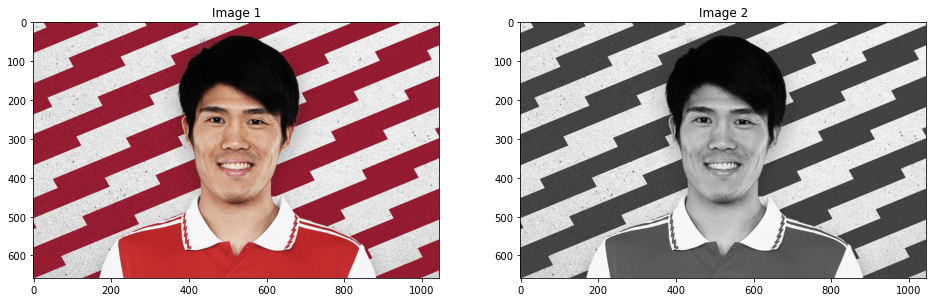

In [40]:
# Read Image 
image_color = imread("tomiyasu.jpg")
# Convert Image into Gray
image_gray = grayscaleImage(image_color)

# Display Image
ShowTwoImages(image_color, image_gray)

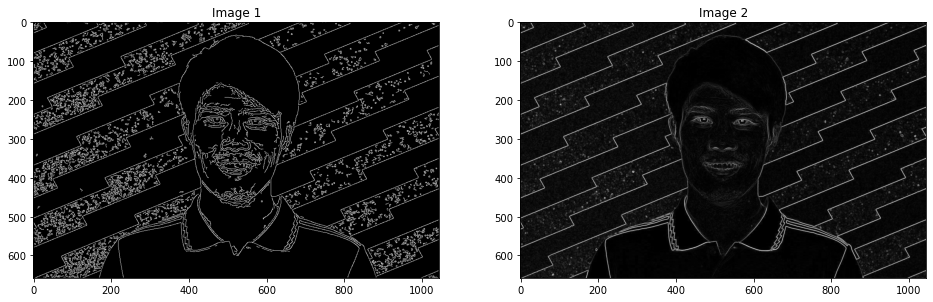

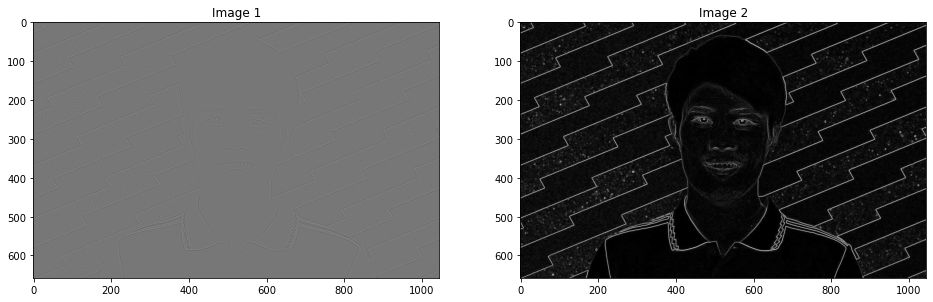

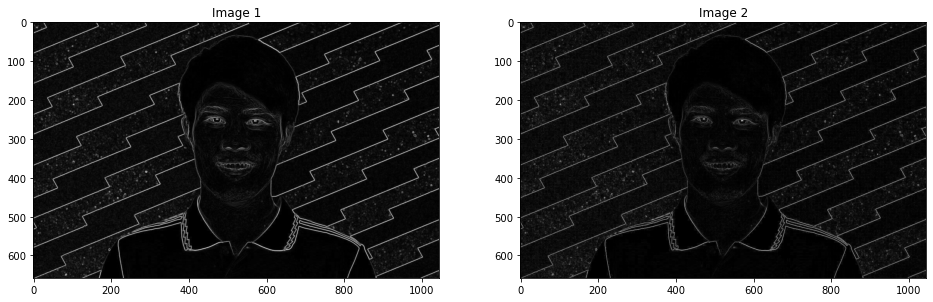

In [41]:
import cv2
from skimage import feature, filters

edges_canny = feature.canny(image_gray) # Canny
edges_sobel = filters.sobel(image_gray) # Sobel
edges_laplace = filters.laplace(image_gray) # Laplacian
edges_scharr = filters.scharr(image_gray) # Scharr
edges_prewitt = filters.prewitt(image_gray) # Prewitt
edges_roberts = filters.roberts(image_gray) # Roberts

ShowTwoImages(edges_canny, edges_sobel)
ShowTwoImages(edges_laplace, edges_scharr)
ShowTwoImages(edges_prewitt, edges_roberts)

In [44]:
# Show Information of Gray Image
Image = edges_sobel.copy()
Width = Image.shape[1]
Height = Image.shape[0]
Channel = len(Image.shape)
print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)

IM = image_color.copy
if(Channel == 2):
    print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
else:
    print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
    print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
    print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max()) 

Width :  1045  Height :  658  Channel :  2
Min Intensity:  0.0  Max Intensity:  0.6406163230486727


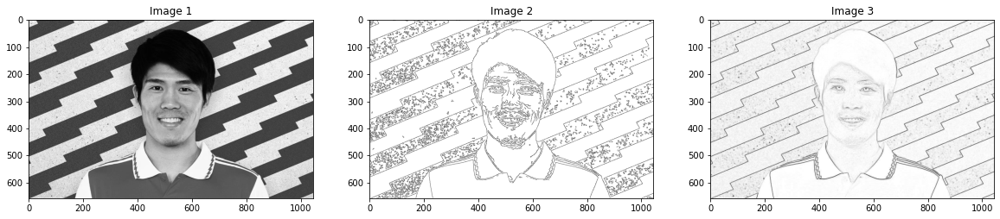

In [43]:
# Invert 
ShowThreeImages(image_gray, 1 - edges_canny, 1 - edges_sobel)

## Tìm chọn range màu lower và upper để trích xuất được các khuôn mặt trong ảnh màu 

In [49]:
# Read Image 
image_color = imread("football-team.jpg")

In [50]:
# Edge Detection on Color Image
from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage import filters

@adapt_rgb(each_channel)
def sobel_each(image):
    return filters.sobel(image)

@adapt_rgb(hsv_value)
def sobel_hsv(image):
    return filters.sobel(image)

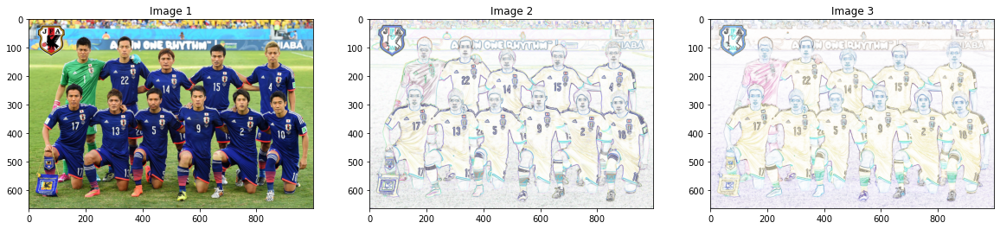

In [51]:
from skimage.exposure import rescale_intensity

image_sobel_rgb = rescale_intensity(1 - sobel_each(image_color))
image_sobel_hsv = rescale_intensity(1 - sobel_hsv(image_color))

ShowThreeImages(image_color, image_sobel_rgb, image_sobel_hsv)

# Câu 3:


Image Size: (628, 1200, 3)


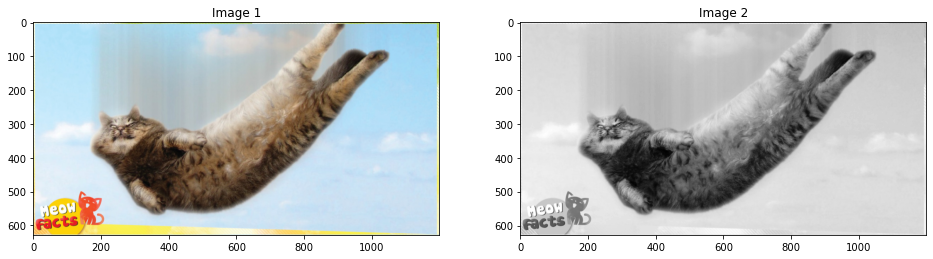

In [52]:
# Read Image 
image_color = imread("kitty-fly.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

## Xuất ảnh xoay các góc 30,45,60 độ

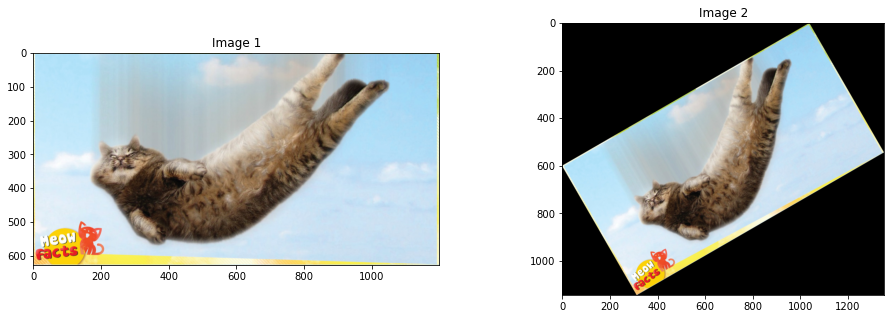

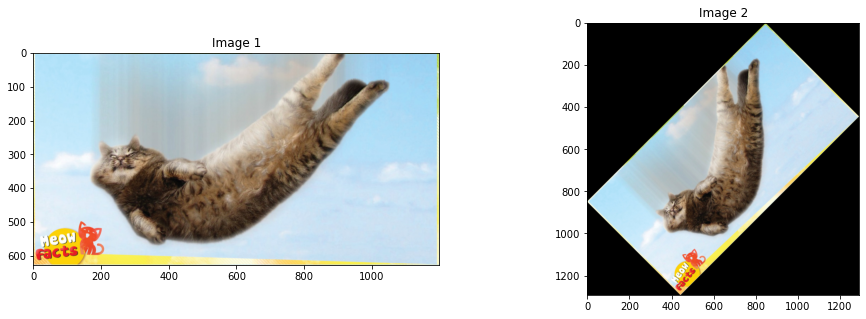

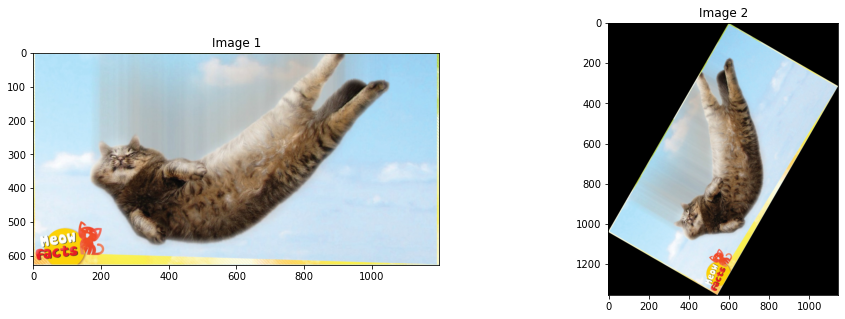

In [57]:
from skimage.transform import rotate
# Xoay góc 30 độ:
image_color_rotate_30 = rotate(image_color, 30, resize=True)
ShowTwoImages(image_color, image_color_rotate_30)

# Xoay góc 45 độ:
image_color_rotate_45 = rotate(image_color, 45, resize=True)
ShowTwoImages(image_color, image_color_rotate_45)

# Xoay góc 60 độ:
image_color_rotate_60 = rotate(image_color, 60, resize=True)
ShowTwoImages(image_color, image_color_rotate_60)

## Xuất ảnh đối xứng qua trục hoành và trục tung đi qua tâm ảnh

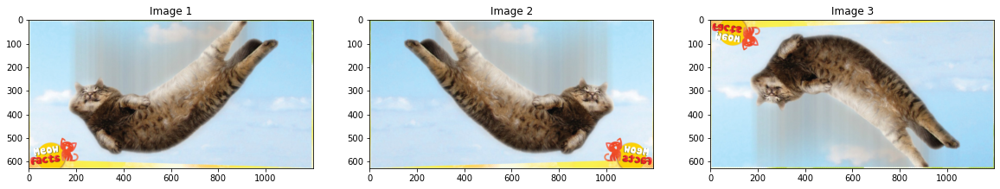

In [58]:
image_color_horizontal_flip = image_color[:, ::-1]
image_color_vertical_flip = image_color[::-1, :]

ShowThreeImages(image_color, image_color_horizontal_flip,image_color_vertical_flip)

## Xuất ảnh Inversion

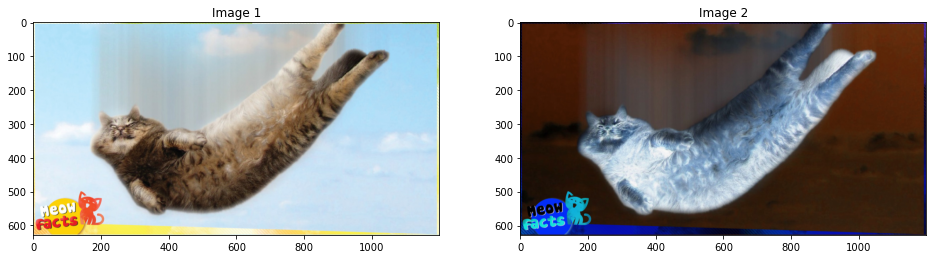

In [59]:
from skimage import util
image_color_inversion = util.invert(image_color)
ShowTwoImages(image_color, image_color_inversion)

## Xuất ảnh enhance contrast

73.0 245.0


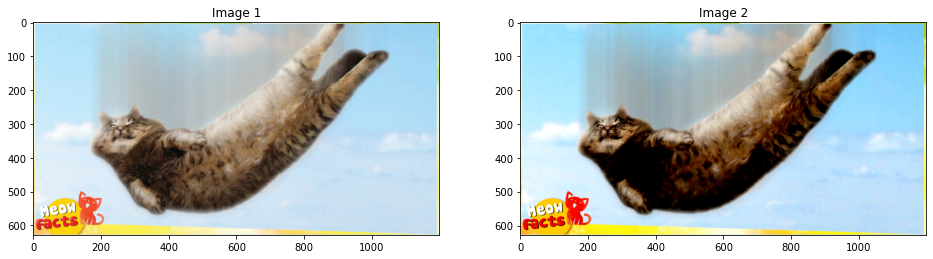

In [60]:
import numpy as np
from skimage import exposure

# take from 10 to 90 percent of color range
v_min, v_max = np.percentile(image_color, (10, 90))
better_contrast = exposure.rescale_intensity(image_color, in_range=(v_min, v_max))

print(v_min, v_max)
ShowTwoImages(image_color, better_contrast)

## Xuất ảnh gamma

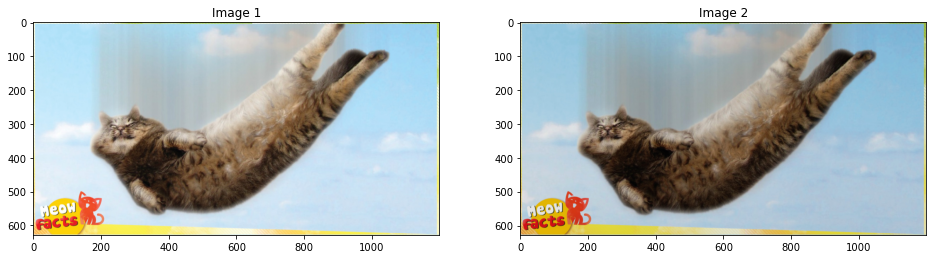

In [61]:
# gamma and gain parameters are between 0 and 1
adjusted_gamma_image = exposure.adjust_gamma(image_color, gamma=1.2, gain=0.9)
ShowTwoImages(image_color, adjusted_gamma_image)

## Xuất ảnh log enhancement 

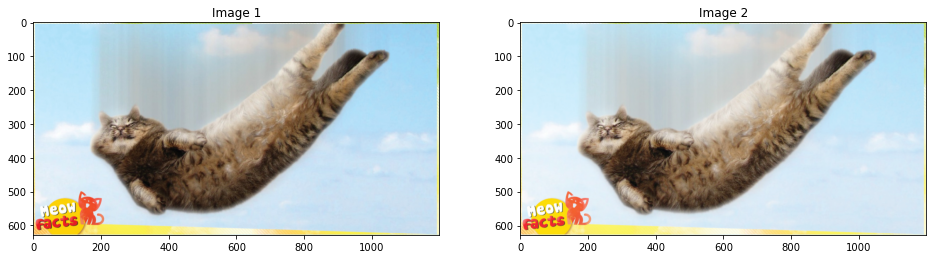

In [62]:
# Logarithmic corrected
log_correction_image = exposure.adjust_log(image_color)

ShowTwoImages(image_color, log_correction_image)